In [1]:
import pandas as pd
from gensim.models import LdaModel
from gensim.corpora import Dictionary
from gensim.utils import simple_preprocess
from nltk.corpus import stopwords
import string

# Load the CSV file
df = pd.read_csv("sectionized_data.csv")
df = df.dropna()

# Preprocessing function
def preprocess(text):
    
    text = text.lower()  # Convert text to lowercase
    tokens = simple_preprocess(text, deacc=True)  # Tokenize and remove accents
    return tokens

# Tokenize and preprocess the text
df['tokens'] = df['Body'].apply(preprocess)

# Filter out rows with empty token lists
df = df[df['tokens'].map(len) > 0]

# Reset the index of the DataFrame
df.reset_index(drop=True, inplace=True)

In [ ]:
from transformers import BertTokenizer, BertModel
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import torch
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

# Load pre-trained BERT Legal model and tokenizer
model_name = 'nlpaueb/legal-bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# Encode your documents into BERT embeddings
documents = df['tokens']  # Your list of preprocessed text documents

# Encode each document
encoded_documents = [tokenizer.encode(doc, add_special_tokens=True, max_length=512, truncation=True, padding='max_length', return_tensors='pt') for doc in documents]

# Compute BERT embeddings for each document
with torch.no_grad():
    embeddings = []
    for encoded_doc in encoded_documents:
        outputs = model(encoded_doc)
        pooled_output = outputs[1]  # Take the pooled output
        embeddings.append(pooled_output.numpy())

# Flatten the embeddings
flat_embeddings = np.concatenate(embeddings, axis=0)

# Range of possible numbers of topics to try
num_topics_range = range(30, 100)

# Initialize list to store the within-cluster sum of squares (WCSS) for each k
wcss_values = []

# Iterate over different numbers of topics (clusters)
for num_topics in num_topics_range:
    # Apply KMeans clustering to identify topics
    kmeans = KMeans(n_clusters=num_topics, random_state=42)
    kmeans.fit(flat_embeddings)
    
    # Calculate WCSS (within-cluster sum of squares)
    wcss = kmeans.inertia_
    
    # Append WCSS value to list
    wcss_values.append(wcss)

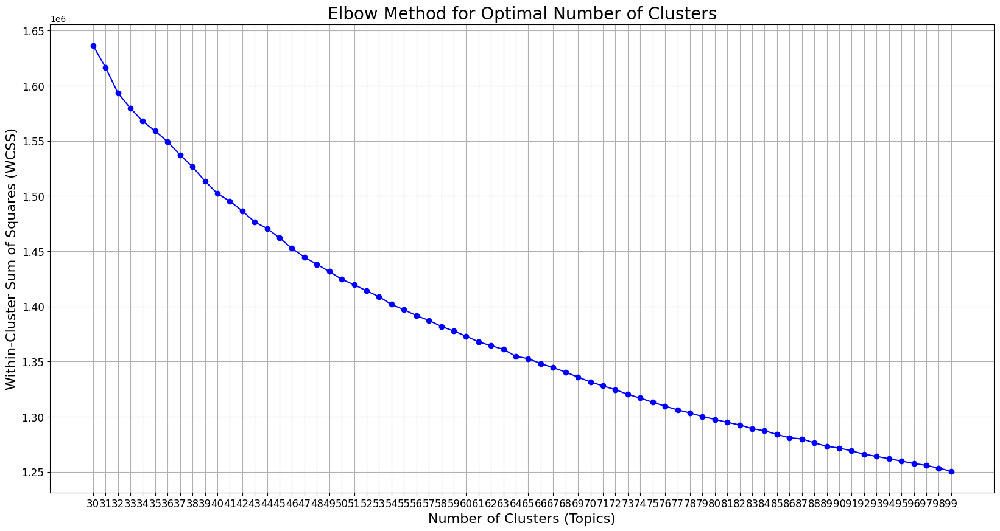

In [ ]:
plt.figure(figsize=(20, 10))  # Increase the figsize here
plt.plot(num_topics_range, wcss_values, marker='o', linestyle='-', color='b')
plt.title('Elbow Method for Optimal Number of Clusters', fontsize=20)  # You can also adjust title font size
plt.xlabel('Number of Clusters (Topics)', fontsize=16)  # And the font size of the axis labels
plt.ylabel('Within-Cluster Sum of Squares (WCSS)', fontsize=16)
plt.xticks(num_topics_range, fontsize=12)  # And the ticks
plt.yticks(fontsize=12)
plt.grid(True)
plt.show()

In [5]:
optimal_num_topics=45

In [6]:
from collections import Counter
import string
from nltk.corpus import stopwords


# Load pre-trained BERT Legal model and tokenizer
model_name = 'nlpaueb/legal-bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# Load English stop words
stop_words = set(stopwords.words('english'))

# Encode your documents into BERT embeddings
documents = df['tokens']  # Your list of preprocessed text documents

# Encode each document
encoded_documents = [tokenizer.encode(doc, add_special_tokens=True, max_length=512, truncation=True, padding='max_length', return_tensors='pt') for doc in documents]

# Compute BERT embeddings for each document
with torch.no_grad():
    embeddings = []
    for encoded_doc in encoded_documents:
        outputs = model(encoded_doc)
        pooled_output = outputs[1]  # Take the pooled output
        embeddings.append(pooled_output.numpy())

# Flatten the embeddings
flat_embeddings = np.concatenate(embeddings, axis=0)

# Apply clustering (e.g., KMeans) to identify topics
num_topics = optimal_num_topics
kmeans = KMeans(n_clusters=num_topics, random_state=42)
topic_labels = kmeans.fit_predict(flat_embeddings)

# Print the assigned topic labels for each document
document_topic_labels = {}
for i, label in enumerate(topic_labels):
    print(f"Document {i}: Topic {label}")
    document_topic_labels["Document " + str(i)] = "Topic " + str(label)

# Collect documents assigned to each topic
documents = df['Body']
topic_documents = [[] for _ in range(num_topics)]
for i, label in enumerate(topic_labels):
    topic_documents[label].append(documents[i])

# Tokenize the combined text of each topic and filter out stop words, punctuation, short words, and words containing '#'
topic_tokenized_texts = []
for docs in topic_documents:
    # Ensure that each element in docs is a string
    docs = [str(doc) for doc in docs]
    combined_text = ' '.join(docs)
    # Tokenize the text
    tokens = tokenizer.tokenize(combined_text)
    # Filter out stop words, punctuation, short words, and words containing '#'
    filtered_tokens = [token for token in tokens if token not in stop_words and token not in string.punctuation and len(token) > 3 and '#' not in token]
    topic_tokenized_texts.append(filtered_tokens)

# Count the occurrences of each word in the tokenized text
word_distributions = [Counter(tokens) for tokens in topic_tokenized_texts]

# Calculate total number of words in each topic
topic_word_counts = [sum(word_distribution.values()) for word_distribution in word_distributions]

# Calculate the probability of each word in each topic and get the top 10 words
top_words_probability = []
for topic_idx, word_distribution in enumerate(word_distributions):
    top_words = word_distribution.most_common(10)
    topic_probability = {word: count / topic_word_counts[topic_idx] for word, count in top_words}
    top_words_probability.append(topic_probability)

# Create a dictionary to store the top words distribution for each topic
top_words_distribution_dict = {}
for topic_idx, topic_probability in enumerate(top_words_probability):
    top_words_distribution_dict[f"Topic {topic_idx }"] = topic_probability

# Print the dictionary
print(top_words_distribution_dict)


Document 0: Topic 1
Document 1: Topic 15
Document 2: Topic 15
Document 3: Topic 12
Document 4: Topic 23
Document 5: Topic 7
Document 6: Topic 3
Document 7: Topic 33
Document 8: Topic 17
Document 9: Topic 27
Document 10: Topic 9
Document 11: Topic 9
Document 12: Topic 42
Document 13: Topic 34
Document 14: Topic 36
Document 15: Topic 34
Document 16: Topic 43
Document 17: Topic 34
Document 18: Topic 41
Document 19: Topic 27
Document 20: Topic 20
Document 21: Topic 22
Document 22: Topic 34
Document 23: Topic 10
Document 24: Topic 42
Document 25: Topic 11
Document 26: Topic 23
Document 27: Topic 21
Document 28: Topic 15
Document 29: Topic 39
Document 30: Topic 9
Document 31: Topic 16
Document 32: Topic 23
Document 33: Topic 1
Document 34: Topic 15
Document 35: Topic 15
Document 36: Topic 25
Document 37: Topic 9
Document 38: Topic 8
Document 39: Topic 24
Document 40: Topic 7
Document 41: Topic 11
Document 42: Topic 29
Document 43: Topic 39
Document 44: Topic 27
Document 45: Topic 22
Document

In [7]:
# Create a dictionary to store the top words distribution for each topic
top_words_distribution_dict = {}
for topic_idx, topic_probability in enumerate(top_words_probability):
    top_words_distribution_dict[f"Topic {topic_idx }"] = topic_probability

# Print the dictionary
print(top_words_distribution_dict)

{'Topic 0': {'would': 0.008904700662960341, 'plaintiff': 0.006071627219013149, 'evidence': 0.00597378305215623, 'also': 0.00589356846491317, 'defendant': 0.005489851091755792, 'court': 0.005229814792451367, 'first': 0.004818164108467752, 'singa': 0.004306906299665831, 'case': 0.004054803311187643, 'made': 0.0037321820042540174}, 'Topic 1': {'court': 0.033231271008752956, 'appeal': 0.0276233900222984, 'high': 0.0205178553599361, 'suit': 0.01950277897959863, '2021': 0.019153326455220155, '2023': 0.01755582920091856, '2022': 0.01752254800812061, 'judgment': 0.016923486537757514, 'reserved': 0.016091456717808768, 'plaintiff': 0.015575598229440542}, 'Topic 2': {'appeal': 0.010260471821522964, 'plaintiff': 0.009788828277255213, 'court': 0.009192599645822395, 'defendant': 0.008560775275199559, 'whether': 0.006469525597785945, 'parties': 0.006371637315013393, 'case': 0.005926690575138156, 'appellant': 0.005730914009593051, 'costs': 0.0056330257268204995, 'judge': 0.005606328922427985}, 'Topic 

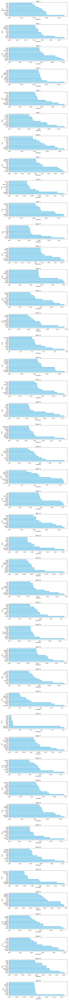

In [8]:
import matplotlib.pyplot as plt

# Function to plot the word distribution for each topic
def plot_topic_word_distribution(top_words_distribution_dict):
    num_topics = len(top_words_distribution_dict)
    fig, axes = plt.subplots(nrows=num_topics, ncols=1, figsize=(10, 3*num_topics))  # Adjust figure size

    for i, (topic, word_distribution) in enumerate(top_words_distribution_dict.items()):
        words = list(word_distribution.keys())
        probabilities = list(word_distribution.values())

        ax = axes[i] if num_topics > 1 else axes
        ax.barh(words, probabilities, color='skyblue')
        ax.set_title(f'{f"Topic {i}"}')
        ax.set_xlabel('Probability')
        ax.set_ylabel('Word')

    plt.tight_layout(pad=3)  # Adjust spacing between subplots
    plt.show()

# Plot the topic word distribution
plot_topic_word_distribution(top_words_distribution_dict)


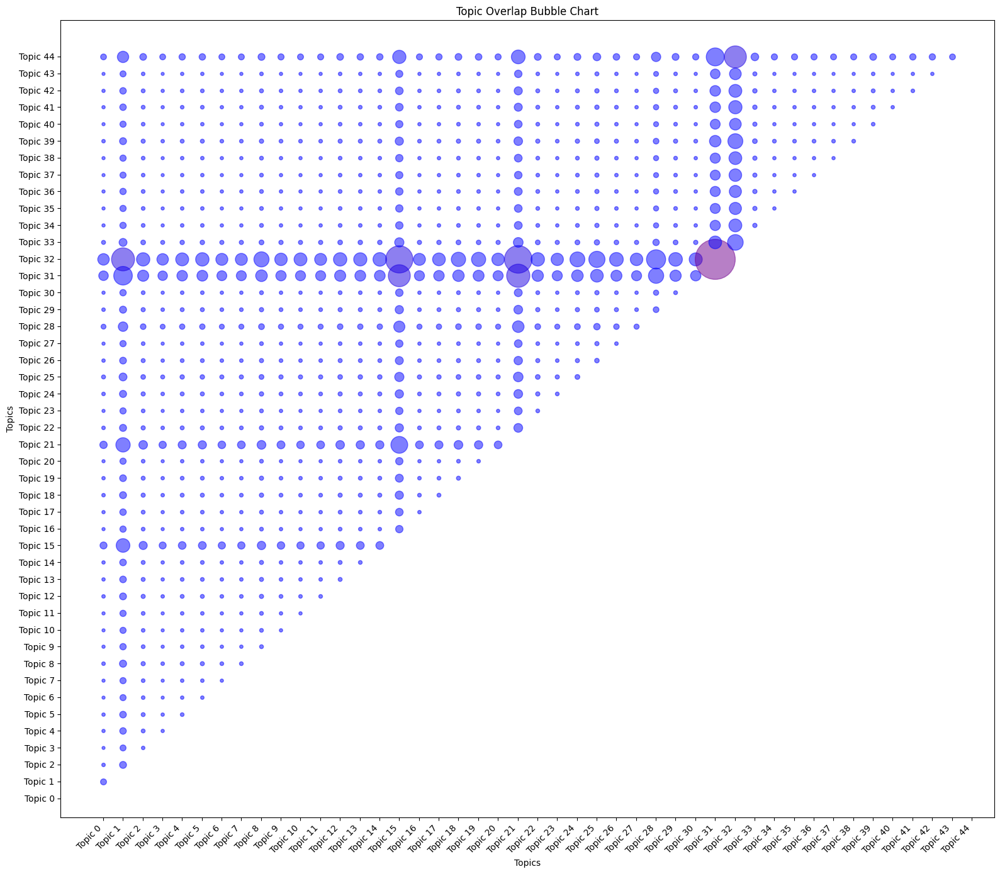

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define the topic keywords and their distributions
topics = top_words_distribution_dict

# Extract topic keywords and distributions
topic_keywords = list(topics.keys())
keyword_distributions = np.array([list(topic.values()) for topic in topics.values()])

# Calculate the overlap matrix
overlap_matrix = np.dot(keyword_distributions, keyword_distributions.T)

# Determine the maximum overlap value
max_overlap = np.max(overlap_matrix)

# Define a custom colormap
colors = [(0, 0, 1), (1, 0, 0)]  # Blue to red
cmap = LinearSegmentedColormap.from_list("Custom", colors, N=10)

# Plot the bubble chart with increased bubble size
plt.figure(figsize=(16, 14))  
for i in range(overlap_matrix.shape[0]):
    for j in range(i + 1, overlap_matrix.shape[1]):
        bubble_size = overlap_matrix[i][j] / max_overlap * 5000  # Adjust bubble size relative to the maximum overlap
        color = 'red' if overlap_matrix[i][j] == max_overlap else cmap(overlap_matrix[i][j] / max_overlap)
        plt.scatter(i, j, s=bubble_size, alpha=0.5, label=f'Topic {i}-{j}', color=color)

# Add labels and legend
plt.xticks(range(len(topic_keywords)), topic_keywords, rotation=45, ha='right')
plt.yticks(range(len(topic_keywords)), topic_keywords)
plt.xlabel('Topics')
plt.ylabel('Topics')
plt.title('Topic Overlap Bubble Chart')
#plt.legend(prop={'size': 8})  # Set font size of legend labels

# Show plot
plt.tight_layout()
plt.show()


In [10]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute pairwise cosine similarity between document embeddings
def compute_coherence_score(embeddings, labels):
    num_topics = len(set(labels))
    coherence_scores = []
    
    for i in range(num_topics):
        # Find documents assigned to the current topic
        topic_documents = embeddings[labels == i]
        
        # Compute pairwise cosine similarity between documents in the same topic
        similarity_matrix = cosine_similarity(topic_documents)
        
        # Compute the average pairwise similarity for the topic
        average_similarity = similarity_matrix.mean()
        
        # Append the coherence score for the topic
        coherence_scores.append(average_similarity)
    
    # Compute the overall coherence score as the mean of the coherence scores for all topics
    overall_coherence_score = sum(coherence_scores) / num_topics
    return overall_coherence_score

# Compute coherence score
coherence_score = compute_coherence_score(flat_embeddings, topic_labels)
print("Coherence Score:", coherence_score)

Coherence Score: 0.9630539629194471


In [11]:
# Dictionary mapping topic numbers to labels
topics_word_distribution = top_words_distribution_dict

topic_labels = {
    'Topic 0': 'Basic Legal Proceedings',
    'Topic 1': 'Appellate Court Focus',
    'Topic 2': 'Legal Parties and Costs',
    'Topic 3': 'Legal Outcomes and Accusations',
    'Topic 4': 'Evidentiary Challenges in Court',
    'Topic 5': 'First Instance Legal Decisions',
    'Topic 6': 'Legal Proceedings in Singapore',
    'Topic 7': 'Case Development and Evidence Presentation',
    'Topic 8': 'Contractual Agreements and Disputes',
    'Topic 9': 'Comprehensive Legal Analysis',
    'Topic 10': 'Temporal Evidence and Accusations',
    'Topic 11': 'Costs and Parties in Appeal',
    'Topic 12': 'Legal Judgments and Timelines',
    'Topic 13': 'Legal Procedures and Criminal Cases',
    'Topic 14': 'High Court\'s Comprehensive Review',
    'Topic 15': 'Evidence and Appeal in Legal Proceedings',
    'Topic 16': 'Legal Frameworks and Government Involvement',
    'Topic 17': 'Defendant-Centric Legal Analysis',
    'Topic 18': 'Civil Procedure and Legal Applications',
    'Topic 19': 'Year-Specific Legal Changes',
    'Topic 20': 'Criminal Procedure and Court Summons',
    'Topic 21': 'Legal Strategy and Party Dynamics',
    'Topic 22': 'Company Disputes and Legal Agreements',
    'Topic 23': 'Detailed Court Case Review',
    'Topic 24': 'Legal Issues and Appellate Decisions',
    'Topic 25': 'Whether and Appeal Insights',
    'Topic 26': 'Plaintiff and Defendant Focus',
    'Topic 27': 'Evidence and Judicial Considerations',
    'Topic 28': 'Court Decisions and Legal Frameworks',
    'Topic 29': 'Appeal Procedures and Legal Implications',
    'Topic 30': 'Judicial Processes and Defendant Rights',
    'Topic 31': 'Appellate Court Insights and Procedures',
    'Topic 32': 'Defendant Dominance in Legal Proceedings',
    'Topic 33': 'Procedural Aspects in Criminal Law',
    'Topic 34': 'Legal Evidence and Case Outcomes',
    'Topic 35': 'Judicial Decision-Making and Legal Parties',
    'Topic 36': 'Legal Analysis of Defendant Actions',
    'Topic 37': 'Evidence Dynamics in Court Decisions',
    'Topic 38': 'Judicial Considerations and Legal Evidence',
    'Topic 39': 'Corporate Legal Affairs and Agreements',
    'Topic 40': 'Legal Proceedings and Evidence Assessment',
    'Topic 41': 'Judicial Review and Legal Procedures',
    'Topic 42': 'Case Analysis and Legal Strategies',
    'Topic 43': 'Defendant and Plaintiff Legal Dynamics',
    'Topic 44': 'Judicial Procedures and Party Dynamics'
}


# Replace topic numbers with labels
labeled_document_topic = {}

for docs, topic in document_topic_labels.items():
    labeled_document_topic[docs] = topic_labels[topic]

# Print the labeled topic distribution
print(labeled_document_topic)

{'Document 0': 'Appellate Court Focus', 'Document 1': 'Evidence and Appeal in Legal Proceedings', 'Document 2': 'Evidence and Appeal in Legal Proceedings', 'Document 3': 'Legal Judgments and Timelines', 'Document 4': 'Detailed Court Case Review', 'Document 5': 'Case Development and Evidence Presentation', 'Document 6': 'Legal Outcomes and Accusations', 'Document 7': 'Procedural Aspects in Criminal Law', 'Document 8': 'Defendant-Centric Legal Analysis', 'Document 9': 'Evidence and Judicial Considerations', 'Document 10': 'Comprehensive Legal Analysis', 'Document 11': 'Comprehensive Legal Analysis', 'Document 12': 'Case Analysis and Legal Strategies', 'Document 13': 'Legal Evidence and Case Outcomes', 'Document 14': 'Legal Analysis of Defendant Actions', 'Document 15': 'Legal Evidence and Case Outcomes', 'Document 16': 'Defendant and Plaintiff Legal Dynamics', 'Document 17': 'Legal Evidence and Case Outcomes', 'Document 18': 'Judicial Review and Legal Procedures', 'Document 19': 'Evidenc

In [12]:
from transformers import BertTokenizer, BertModel
import torch
import json

# Define the directory where the model and tokenizer will be saved
model_directory = "legal_bert_model"

# Load pre-trained BERT Legal model and tokenizer
model_name = 'nlpaueb/legal-bert-base-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# Save the model and tokenizer
model.save_pretrained(model_directory)
tokenizer.save_pretrained(model_directory)

# Save the topic labels to a JSON file
with open(f"{model_directory}/topic_labels.json", "w") as file:
    json.dump(topic_labels, file)

print("Model, tokenizer, and topic labels saved successfully.")

# Now you can load the model and topic labels when needed and use them to predict the topic of a new document


Model, tokenizer, and topic labels saved successfully.


In [13]:
from transformers import BertTokenizer, BertModel
from sklearn.cluster import KMeans
import torch
import json

# Load the model and tokenizer
model_directory = "legal_bert_model"
tokenizer = BertTokenizer.from_pretrained(model_directory)
model = BertModel.from_pretrained(model_directory)

# Load the topic labels
with open(f"{model_directory}/topic_labels.json", "r") as file:
    topic_labels = json.load(file)

# Function to preprocess the text (similar to what was done during training)
def preprocess(text):
    text = text.lower()  # Convert text to lowercase
    tokens = simple_preprocess(text, deacc=True)  # Tokenize and remove accents
    return tokens

# Function to predict the topic label for a new document
def predict_topic(new_document):
    # Preprocess the new document
    preprocessed_doc = preprocess(new_document)

    # Encode the document using the loaded tokenizer
    encoded_doc = tokenizer.encode(preprocessed_doc, add_special_tokens=True, max_length=512, truncation=True, padding='max_length', return_tensors='pt')

    # Compute BERT embeddings for the document
    with torch.no_grad():
        outputs = model(encoded_doc)
        pooled_output = outputs[1].numpy()  # Take the pooled output

    # Use KMeans model to predict the topic label
    topic_label = kmeans.predict(pooled_output)[0]

    # Map the predicted label to the corresponding topic
    predicted_topic = topic_labels[f"Topic {topic_label}"]

    return predicted_topic

# Example usage
new_document = df['Body'][2303]
predicted_topic = predict_topic(new_document)
print("Predicted Topic:", predicted_topic)


Predicted Topic: Court Decisions and Legal Frameworks


In [14]:
import joblib
import json

# Save the trained KMeans model
joblib.dump(kmeans, 'kmeans_model.pkl')

# File path where you want to save the JSON file
file_path = 'top_words_distribution.json'

# Save the dictionary to a JSON file
with open(file_path, 'w') as json_file:
    json.dump(top_words_distribution_dict, json_file)

In [15]:
from collections import defaultdict

document_topics = labeled_document_topic
total_documents = len(document_topics)

# Initialize a dictionary to store the count of documents for each topic
topic_distribution = defaultdict(int)

# Count the number of documents for each topic
for topic in document_topics.values():
    topic_distribution[topic] += 1

# Convert the counts to probabilities
topic_probabilities = {f'{i}': count / total_documents for i, count in topic_distribution.items()}

import json
# File path where you want to save the JSON file
file_path = 'topic_distribution_test.json'

# Save the dictionary to a JSON file
with open(file_path, 'w') as json_file:
    json.dump(topic_probabilities, json_file)

print("JSON file saved successfully!")

# File path where you want to save the JSON file
file_path = 'labeled_document_topic_test.json'

# Save the dictionary to a JSON file
with open(file_path, 'w') as json_file:
    json.dump(labeled_document_topic, json_file)

print("JSON file saved successfully!")

JSON file saved successfully!
JSON file saved successfully!
